In [159]:
import os
import pandas as pd
import numpy as np
from tqdm import tqdm
import json
import cv2
from glob import glob

import matplotlib.pyplot as plt
import seaborn as sns

In [160]:
h, w, _ = cv2.imread("train_RZHD_TrudovieKnizhki/29/29_1.jpg").shape

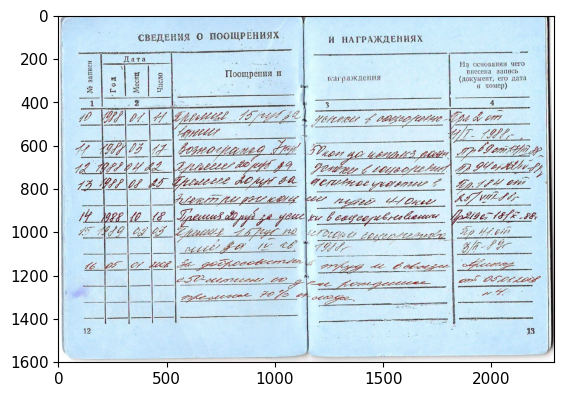

In [161]:
plt.imshow(cv2.imread("train_RZHD_TrudovieKnizhki/29/29_1.jpg")[:, :]);

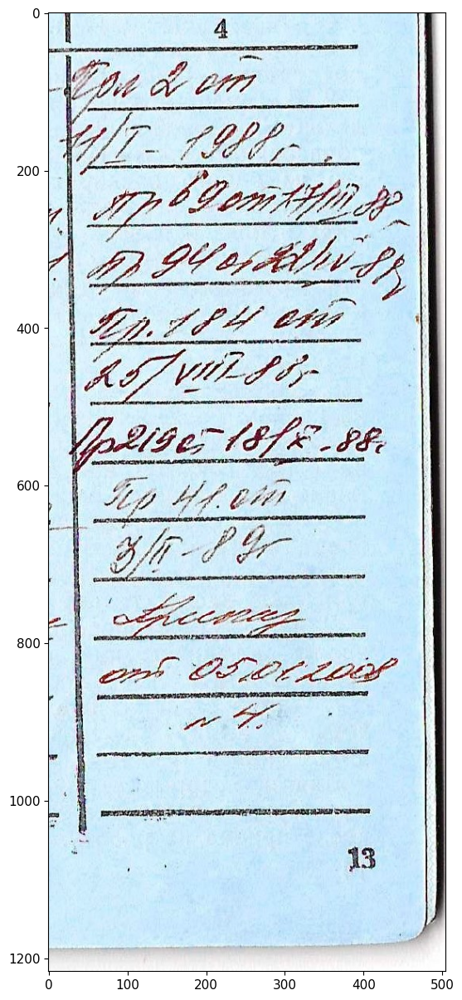

In [162]:
plt.subplots(figsize=[13, 15])


plt.imshow(cv2.imread("train_RZHD_TrudovieKnizhki/29/29_1.jpg")[int(h * 0.24):, int(w * 0.78):]);

True

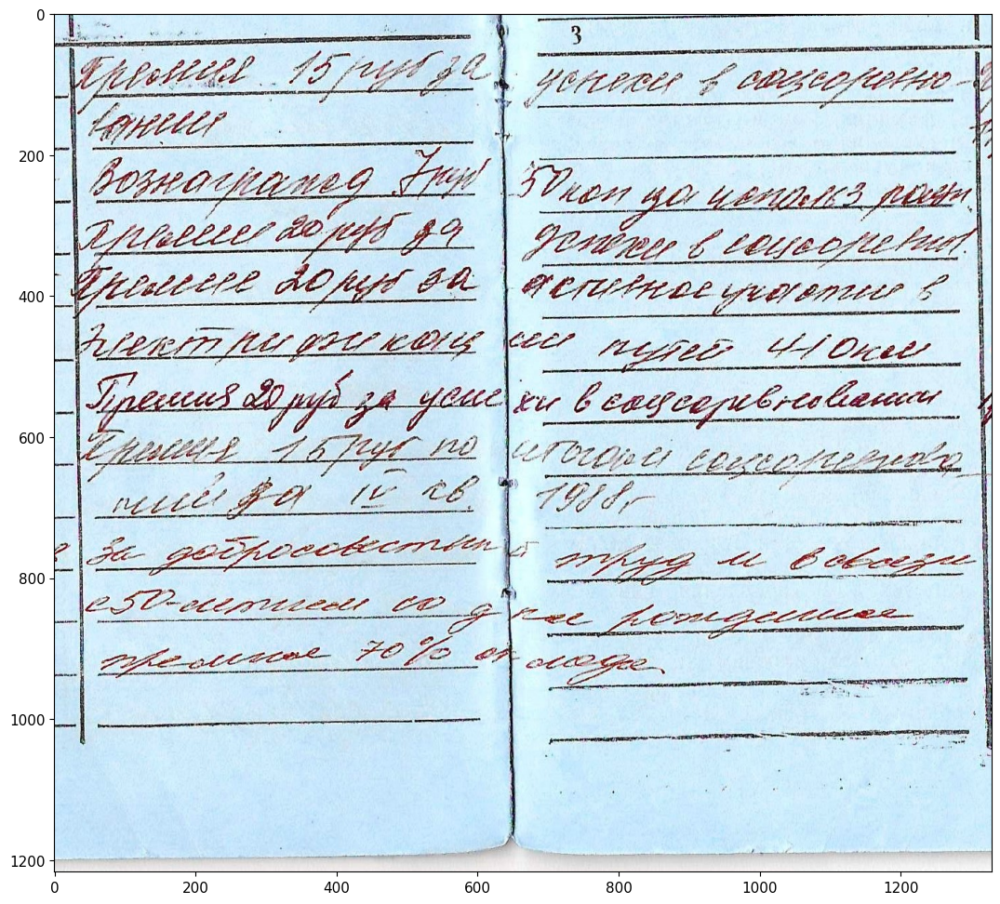

In [191]:
plt.subplots(figsize=[13, 15])


plt.imshow(cv2.imread("train_RZHD_TrudovieKnizhki/29/29_1.jpg")[int(h * 0.24):, int(w * 0.22):int(w * 0.8)]);


img = cv2.imread("train_RZHD_TrudovieKnizhki/29/29_1.jpg")[int(h * 0.24):, int(w * 0.22):int(w * 0.8)]
cv2.imwrite('test2.jpg', img)

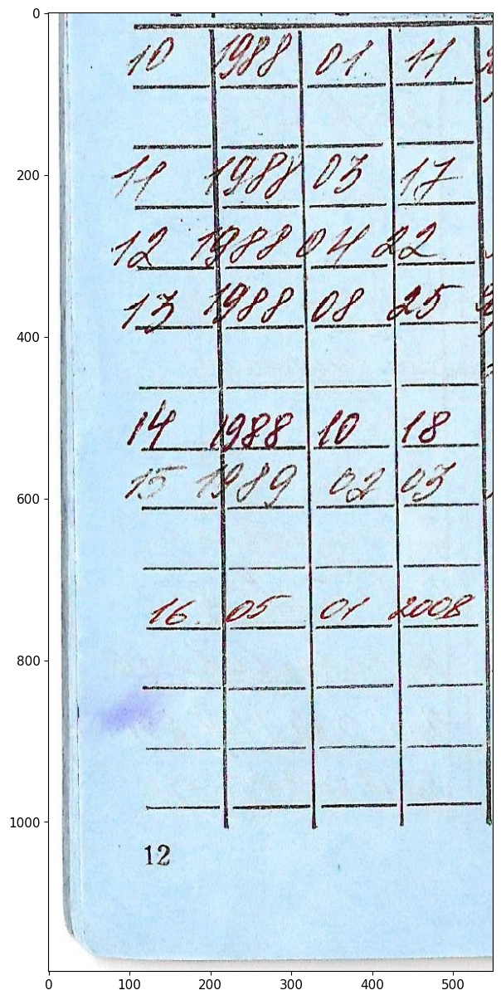

In [192]:
plt.subplots(figsize=[13, 15])


# plt.imshow(cv2.imread("train_RZHD_TrudovieKnizhki/29/29_1.jpg")[int(h * 0.26):, :int(w * 0.24)]);
plt.imshow(cv2.imread("train_RZHD_TrudovieKnizhki/29/29_1.jpg")[int(h * 0.26):, :int(w * 0.24)])

In [193]:
img = cv2.imread("train_RZHD_TrudovieKnizhki/29/29_1.jpg")[int(h * 0.26):, :int(w * 0.24)]
cv2.imwrite('test.jpg', img)

True

In [194]:
from shiftlab_ocr.doc2text.reader import Reader

In [195]:
reader = Reader()

recognizer weights has loaded from c:\Users\Egor\AppData\Local\Programs\Python\Python310\lib\site-packages\shiftlab_ocr\doc2text\ocr_transformer_4h2l_simple_conv_64x256.pt
requirements: C:\Users\Egor\AppData\Local\Programs\Python\Python310\Lib\site-packages\shiftlab_ocr\doc2text\yolov5\requirements.txt not found, check failed.


In [196]:
result = reader.doc2text("test.jpg")

In [197]:
print(result[0])

10 198 01. 11 раземление 11 191 98705 05 17 12 7981 Ф. 11 до2 А 17 1987 17 198 08 25 4 14 14 198 988 10 988-10 18 объект 1.к. 19 СУ 07 07.05 16 05 01 ход 01 2008 2012 12 


In [198]:
print(len(result[0].split()))

44


In [199]:
'adf'.replace('.', '').replace(')', '')

'adf'

дер увли 28 5 инт уснехся в соцеорено верог де Анеля Вознагражу Ушуб букот кот ца и исполе прод до до оснеже 11. соцесофи есть Треме 20 руг да участие 12 интрификац сеся путей 4 Они 20 Премив до труб, дом к сл в соцесоревновании кренц 5 трус по того 01 сексонены имёл БОА 16 пов Гень 915 20 Эс добросовество этруд ли в связи с50-литики его ные Пождение премное 7015 моде т.к. 
[[20.488136291503906, 63.1561393737793], [98.63546752929688, 103.99351501464844]]
дер False False
[[79.16997528076172, 57.394554138183594], [278.3245849609375, 103.52357482910156]]
увли False False
[[332.3435363769531, 60.11948013305664], [400.4673156738281, 95.5772705078125]]
28 True True
[[364.8245544433594, 47.47683334350586], [587.9468383789062, 101.8001480102539]]
5 True True
[[667.9935302734375, 69.1966552734375], [896.1522827148438, 124.7816162109375]]
инт False False
[[891.3118896484375, 65.6042709350586], [1270.7296142578125, 122.85757446289062]]
уснехся False False
[[1303.283935546875, 61.50648880004883], 

C:\Users\Egor\AppData\Local\Temp\ipykernel_5116\1615610092.py:25: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


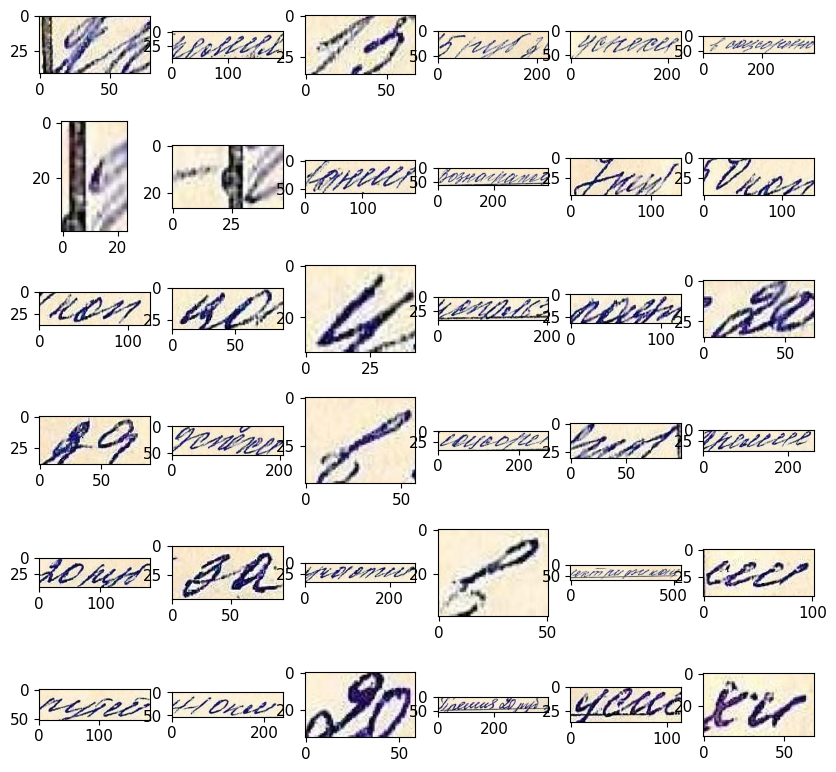

In [201]:
import matplotlib.pyplot as plt
%matplotlib inline

result = reader.doc2text("test2.jpg")
print(result[0])

images = result[1]
N = 48  # how many crops to show
n = int(N ** (0.5))
k = 0
dt = result[0].split()
dt_box = []
f, axarr = plt.subplots(n,n,figsize=(10,10))
for i in range(n):
    for j in range(n):
        # print(dt[k], dt[k].isdigit(), dt[k].replace('.', '').replace(')', '').isdigit())
        
        axarr[i, j].imshow(images[k].img)
        dt_box.append(dt[k].replace('.', '').replace(')', ''))
        print(images[k].points)
        print(dt[k], dt[k].isdigit(), dt[k].replace('.', '').replace(')', '').isdigit())
        # else:
            # print(dt[k].replace('.', '').replace(')', '').isdigit(), dt[k])
        k += 1
f.show()
print(dt_box)

In [222]:
result = reader.doc2text("test.jpg")
print(result[0])

10 198 01. 11 раземление 11 191 98705 05 17 12 7981 Ф. 11 до2 А 17 1987 17 198 08 25 4 14 14 198 988 10 988-10 18 объект 1.к. 19 СУ 07 07.05 16 05 01 ход 01 2008 2012 12 


In [223]:
def filter_boxes_by_distance(boxes, max_distance):
    # Получаем расстояния между box-ами
    distances = calculate_y_distances(boxes)
    
    # Фильтруем box-ы, где расстояние меньше заданного
    filtered_boxes = []
    for i in range(len(distances)):
        if distances[i] < max_distance:
            if boxes[i] not in filtered_boxes:
                filtered_boxes.append(boxes[i])
            if boxes[i+1] not in filtered_boxes:
                filtered_boxes.append(boxes[i+1])

    return filtered_boxes

# Пример данных
boxes = [
    [[90.19766235351562, 29.858707427978516], [158.2107696533203, 82.23281860351562]],
    [[205.29954528808594, 18.61149787902832], [299.3912658691406, 79.07688903808594]],
    [[76.69420623779297, 175.54579162597656], [147.8729705810547, 226.02381896972656]]
]

# Пороговое значение для расстояния
max_distance = 20  # Примерное значение, задайте своё

# Отбор box-ов
filtered_boxes = filter_boxes_by_distance(boxes, 96.46890258789062)
print("Box-ы с расстоянием меньше заданного порога:")
for box in filtered_boxes:
    print(box)

Box-ы с расстоянием меньше заданного порога:
[[90.19766235351562, 29.858707427978516], [158.2107696533203, 82.23281860351562]]
[[205.29954528808594, 18.61149787902832], [299.3912658691406, 79.07688903808594]]


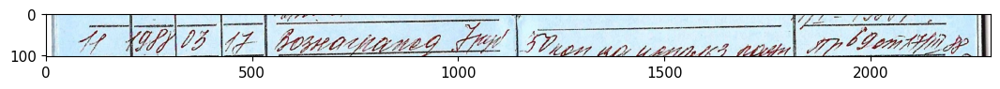

In [224]:
plt.subplots(figsize=[13, 15])

img = cv2.imread("train_RZHD_TrudovieKnizhki/29/29_1.jpg")[int(h * 0.24):, :]
plt.imshow(img[167:270, :]);

In [231]:
def calculate_y_distances(boxes):
    # Создаем список для хранения расстояний
    distances = []
    
    # Проходим по списку box-ов, рассчитывая расстояния между последовательными парами
    for i in range(len(boxes) - 1):
        # Первый box
        box1_top_y = boxes[i][0][1]
        box1_bottom_y = boxes[i][1][1]

        # Второй box
        box2_top_y = boxes[i+1][0][1]
        box2_bottom_y = boxes[i+1][1][1]
        
        # Добавляем расстояние в список
        distances.append((box1_top_y, box2_top_y))
    
    return distances

# Пример данных
boxes = [
    [[90.19766235351562, 29.858707427978516], [158.2107696533203, 82.23281860351562]],
    [[205.29954528808594, 18.61149787902832], [299.3912658691406, 79.07688903808594]],
    [[76.69420623779297, 175.54579162597656], [147.8729705810547, 226.02381896972656]]
]

# Вычисляем расстояния
distances = calculate_y_distances(dt_box)
for i in distances:
    print("Расстояния между box-ами по координате y:", i)


Расстояния между box-ами по координате y: (29.858707427978516, 18.61149787902832)
Расстояния между box-ами по координате y: (18.61149787902832, 28.94841766357422)
Расстояния между box-ами по координате y: (28.94841766357422, 20.86008644104004)
Расстояния между box-ами по координате y: (20.86008644104004, 175.54579162597656)
Расстояния между box-ами по координате y: (175.54579162597656, 173.88330078125)
Расстояния между box-ами по координате y: (173.88330078125, 166.09996032714844)
Расстояния между box-ами по координате y: (166.09996032714844, 167.1656036376953)
Расстояния между box-ами по координате y: (167.1656036376953, 170.1675262451172)
Расстояния между box-ами по координате y: (170.1675262451172, 259.2975158691406)
Расстояния между box-ами по координате y: (259.2975158691406, 249.54933166503906)
Расстояния между box-ами по координате y: (249.54933166503906, 250.2474822998047)
Расстояния между box-ами по координате y: (250.2474822998047, 335.21807861328125)
Расстояния между box-ами

In [226]:
[[90.19766235351562, 29.858707427978516], [158.2107696533203, 82.23281860351562]]

[[90.19766235351562, 29.858707427978516],
 [158.2107696533203, 82.23281860351562]]

In [227]:
[[20.488136291503906, 63.1561393737793], [98.63546752929688, 103.99351501464844]]

[[20.488136291503906, 63.1561393737793],
 [98.63546752929688, 103.99351501464844]]

[[90.19766235351562, 29.858707427978516], [158.2107696533203, 82.23281860351562]]
10 True True
[[205.29954528808594, 18.61149787902832], [299.3912658691406, 79.07688903808594]]
198 True True
[[326.59906005859375, 28.94841766357422], [408.2986755371094, 79.84892272949219]]
01. False True
[[435.00384521484375, 20.86008644104004], [506.5728454589844, 81.2818374633789]]
11 True True
[[76.69420623779297, 175.54579162597656], [147.8729705810547, 226.02381896972656]]
11 True True
[[189.24046325683594, 173.88330078125], [291.63006591796875, 221.9163360595703]]
191 True True
[[201.9708251953125, 166.09996032714844], [377.5684509277344, 226.404296875]]
98705 True True
[[323.3629455566406, 167.1656036376953], [395.4246520996094, 228.31480407714844]]
05 True True
[[431.96270751953125, 170.1675262451172], [511.8212890625, 222.6047821044922]]
17 True True
[[76.19014739990234, 259.2975158691406], [150.91958618164062, 310.0924987792969]]
12 True True
[[173.37359619140625, 249.54933166503906], [291.319

C:\Users\Egor\AppData\Local\Temp\ipykernel_5116\4159624042.py:22: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


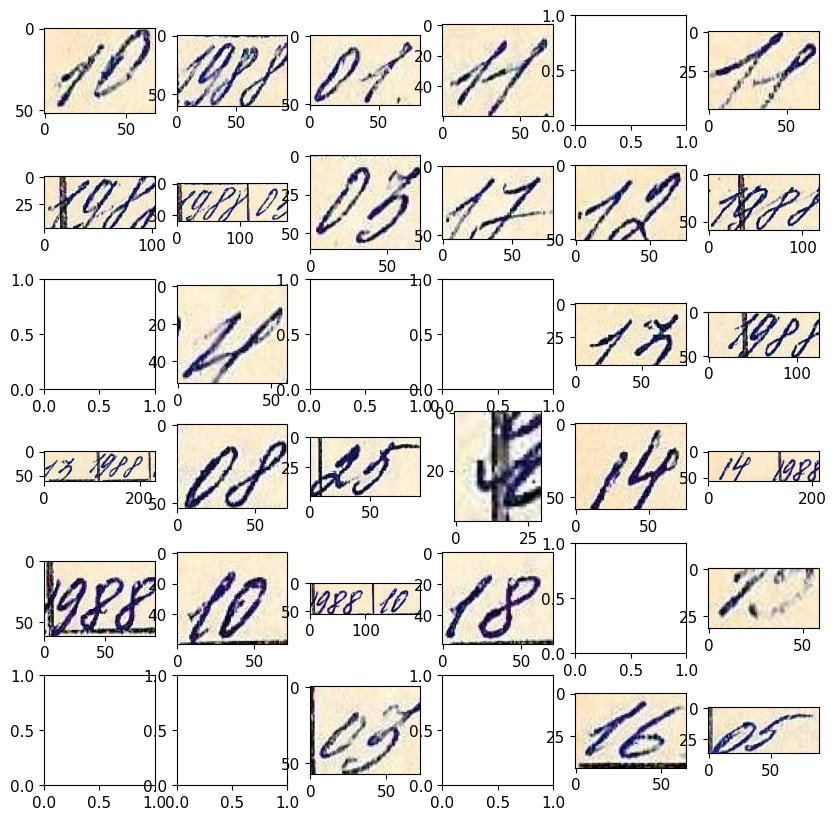

In [228]:
import matplotlib.pyplot as plt
%matplotlib inline

images = result[1]
N = 48  # how many crops to show
n = int(N ** (0.5))
k = 0
dt = result[0].split()
dt_box = []
f, axarr = plt.subplots(n,n,figsize=(10,10))
for i in range(n):
    for j in range(n):
        # print(dt[k], dt[k].isdigit(), dt[k].replace('.', '').replace(')', '').isdigit())
        if dt[k].replace('.', '').replace(')', '').isdigit():
            axarr[i, j].imshow(images[k].img)
            dt_box.append(images[k].points)
            print(images[k].points)
            print(dt[k], dt[k].isdigit(), dt[k].replace('.', '').replace(')', '').isdigit())
        # else:
            # print(dt[k].replace('.', '').replace(')', '').isdigit(), dt[k])
        k += 1
f.show()
print(dt_box)

In [189]:
len(dt_box)

28

In [137]:
'train_RZHD_TrudovieKnizhki/3/IMG-20240504-WA0060.jpg'

'train_RZHD_TrudovieKnizhki/3/IMG-20240504-WA0060.jpg'

In [140]:
h, w, _ = cv2.imread('train_RZHD_TrudovieKnizhki/3/IMG-20240504-WA0060.jpg').shape

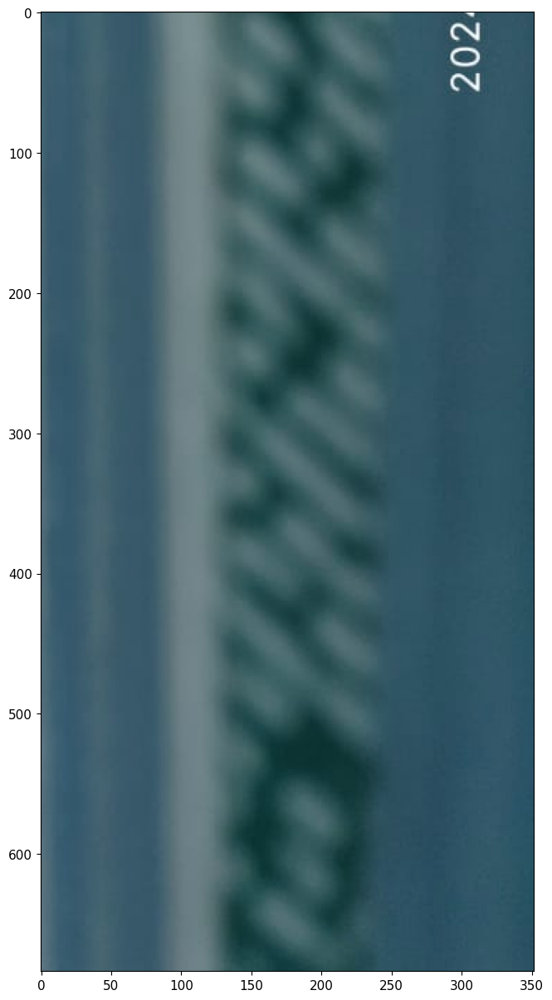

In [141]:
plt.subplots(figsize=[13, 15])


plt.imshow(cv2.imread('train_RZHD_TrudovieKnizhki/3/IMG-20240504-WA0060.jpg')[int(h * 0.24):, int(w * 0.78):]);

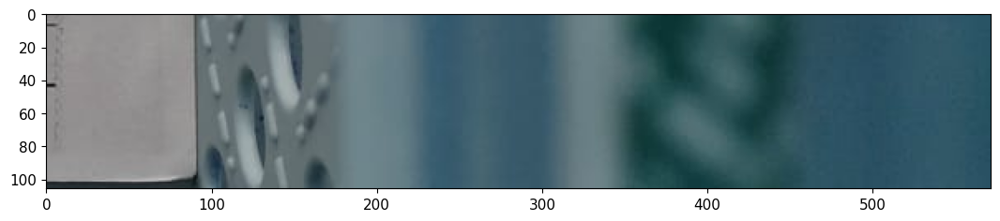

In [151]:
plt.subplots(figsize=[13, 15])


plt.imshow(cv2.imread('train_RZHD_TrudovieKnizhki/3/IMG-20240504-WA0060.jpg')[int(h * 0.24):, int(w * 0.22):int(w * 0.8)]);

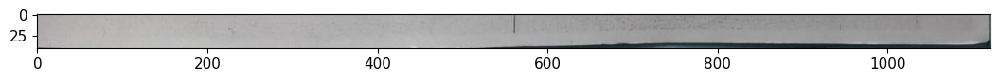

In [152]:
plt.subplots(figsize=[13, 15])


# plt.imshow(cv2.imread("train_RZHD_TrudovieKnizhki/29/29_1.jpg")[int(h * 0.26):, :int(w * 0.24)]);
plt.imshow(cv2.imread('train_RZHD_TrudovieKnizhki/3/IMG-20240504-WA0060.jpg')[int(h * 0.26):, :int(w * 0.24)])

3307 4677


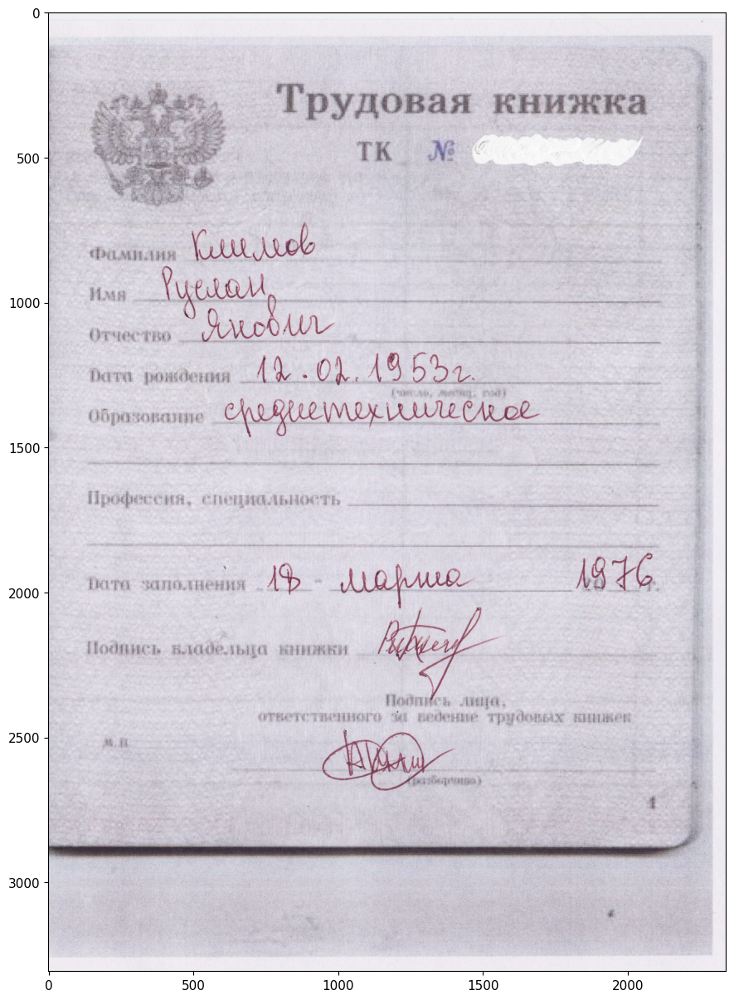

In [147]:
plt.subplots(figsize=[13, 15])

h, w, _ = cv2.imread(r'train_RZHD_TrudovieKnizhki\29\29.JPG').shape

print(h, w)

# plt.imshow(cv2.imread("train_RZHD_TrudovieKnizhki/29/29_1.jpg")[int(h * 0.26):, :int(w * 0.24)]);
plt.imshow(cv2.imread(r'train_RZHD_TrudovieKnizhki\29\29.JPG')[:, int(w * 0.5):]);

In [148]:
img = cv2.imread(r'train_RZHD_TrudovieKnizhki\29\29.JPG')[:, int(w * 0.5):]
cv2.imwrite('test.jpg', img)

True

Круповая хител поли т.к. Л.Н. поли поли элемент Киемов или Руслам Линегия янович поэти интельных 12 Ол. 12.02.1953г. 953 г. Дополнимательно среднежническое Материческое РАЗВЕРНУТМ ОТВЕТОМ 1976 хоте РАЗВЕРНУТМ ОТВЕТОМ 18 марша 100 Начных элемент полны Руриу поли лин РАЗВЕРНУТМ ОТВЕТОМ непреры поли поли этого Юл. С Дану Домение 

Круповая False False
[[1525.441650390625, 251.50250244140625], [2106.68505859375, 371.6315002441406]]
хител False False
[[109.4650650024414, 431.67486572265625], [616.928955078125, 514.1504516601562]]
поли False False
[[1025.7943115234375, 418.582763671875], [1254.0882568359375, 532.8265991210938]]
т.к. False False
[[1279.2239990234375, 433.7098388671875], [1478.8414306640625, 525.6885375976562]]
Л.Н. False False
[[137.32276916503906, 516.448974609375], [592.3601684570312, 610.652099609375]]
поли False False
[[122.79649353027344, 485.8864440917969], [615.2006225585938, 564.05224609375]]
поли False False
[[102.98577880859375, 784.4031982421875], [456.453826904296

C:\Users\Egor\AppData\Local\Temp\ipykernel_5116\2876919981.py:21: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


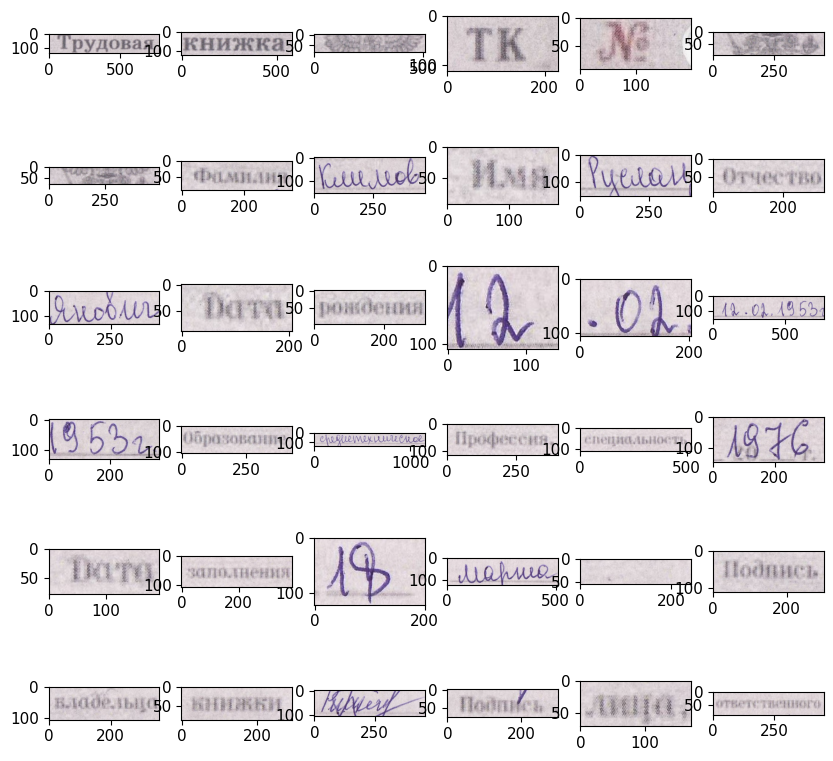

In [150]:
import matplotlib.pyplot as plt
%matplotlib inline

result = reader.doc2text("test.jpg")
print(result[0])
print()

images = result[1]
N = 48  # how many crops to show
n = int(N ** (0.5))
k = 0
dt = result[0].split()
f, axarr = plt.subplots(n,n,figsize=(10,10))
for i in range(n):
    for j in range(n):
        axarr[i,j].imshow(images[k].img)
        k += 1
        print(images[k].points)
f.show()